In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import sklearn
import matplotlib.pyplot as plt
import pickle
from statistics import mean
from collections import defaultdict, OrderedDict

In [2]:
from project_lib import Project
project = Project(project_id='b87b38fc-5ffb-4156-a6e7-f1c7bbab65bb', project_access_token='p-de0a473e4e2a2973c278d29866c588383a38eb4b')
pc = project.project_context

In [3]:
# readout data from pickle file
assetname1 = 'nmf_pu.pickle'
buffer1 = project.get_file(assetname1)
pu = pickle.load(buffer1)

assetname2 = 'nmf_qi.pickle'
buffer2 = project.get_file(assetname2)
qi = pickle.load(buffer2)

In [4]:
# (pipelineID, datasetID) = (256, 121)
print('pu shape: ', pu.shape) # datasetID -> 2 topics
print('qi shape: ', qi.shape) # 2 topics -> pipelineID

pu shape:  (121, 2)
qi shape:  (256, 2)


In [5]:
filename='removed_pplID.csv'
my_file = project.get_file(filename)
my_file.seek(0)
df_removed = pd.read_csv(my_file)
df_removed

,dataset_id,pipeline_id,accuracy
0,41,256,0.737705
1,41,257,0.754098
2,41,258,0.672131
3,41,259,0.754098
4,41,260,0.754098
...,...,...,...
92,49,308,1.000000
93,49,309,1.000000
94,49,310,1.000000
95,49,311,1.000000


## 1. Cluster datasets by pu (datasetID -> 2 topics)

In [6]:
assetname3 = 'datasets_mapping.pickle'
buffer3 = project.get_file(assetname3)
mapping = pickle.load(buffer3)
    
assetname4 = 'num_ppl_data.pickle'
buffer4 = project.get_file(assetname4)
info = pickle.load(buffer4)

In [7]:
from scipy.spatial import distance_matrix
Ws = np.column_stack([pu[:, 0], pu[:, 1]]) # vals = [accs, w0, w1]
dists = distance_matrix(Ws, Ws)

def llf(id):
    dataset_name = mapping[id]
    curr_info = info[dataset_name]
    if id < 121:
        return str(curr_info) + ' ID=' + str(id) + ': '+ dataset_name

/tmp/wsuser/ipykernel_134/1312658914.py:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = hierarchy.linkage(dists)


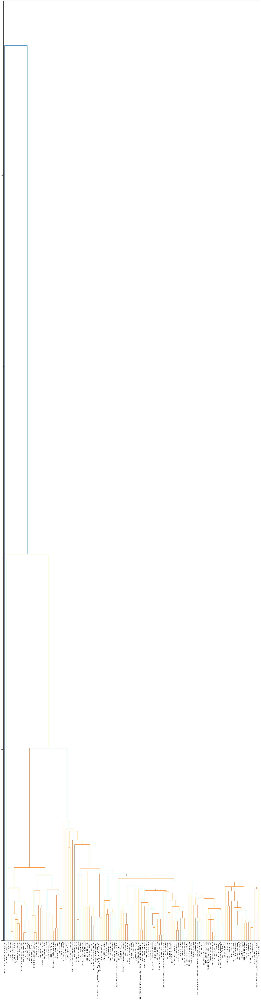

In [8]:
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster import hierarchy

Z = hierarchy.linkage(dists)
#lm = np.column_stack([agg.children_, agg.distances_])
with plt.rc_context(rc={'figure.figsize' : (40,150)}):
    dendrogram(Z, leaf_font_size=12, leaf_label_func=llf, leaf_rotation=90)

#### Scatter plotting
(x, y) = (w1, w1), each dataset take mean accuracy over all pipelines

In [9]:
filename='filtered_pplID.csv'
my_file = project.get_file(filename)
my_file.seek(0)
df = pd.read_csv(my_file)
df

,dataset_id,pipeline_id,accuracy
0,0,0,0.481250
1,0,1,0.496875
2,0,2,0.478125
3,0,3,0.462500
4,0,4,0.478125
...,...,...,...
12104,120,238,0.944444
12105,120,239,1.000000
12106,120,240,0.722222
12107,120,241,0.750000


In [10]:
df['pipeline_id'].unique()

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [11]:
mean(list(df.query('dataset_id == ' + str(0))['accuracy']))

0.49450757575757576

In [12]:
data_acc = {} # {datasetID: mean_acc}
for datasetID in range(121):
    mean_acc = mean(list(df.query('dataset_id == ' + str(datasetID))['accuracy']))
    data_acc[datasetID] = mean_acc
data_acc

{0: 0.49450757575757576,
 1: 0.526015625,
 2: 0.6155598958333334,
 3: 0.535718201754386,
 4: 0.6101222826086956,
 5: 0.5479166666666667,
 6: 0.7328351743556422,
 7: 0.7599090318388564,
 8: 0.7686192062279686,
 9: 0.9387857896145189,
 10: 0.9080365133345266,
 11: 0.9348845534275998,
 12: 0.866732266621032,
 13: 0.9500817063730971,
 14: 0.48333333333333334,
 15: 0.7717948717948718,
 16: 0.748780487804878,
 17: 0.7894736842105263,
 18: 0.1975328947368421,
 19: 0.5076335877862596,
 20: 0.8051230537418383,
 21: 0.96451445386879,
 22: 0.9113669590643275,
 23: 0.8417119565217391,
 24: 0.552647233789411,
 25: 0.8753443526170799,
 26: 0.8855172413793103,
 27: 0.8657694962042788,
 28: 0.8930418719211822,
 29: 0.7566077367407666,
 30: 0.9160685805422648,
 31: 0.9639976958525346,
 32: 0.7953177257525084,
 33: 0.6173913043478261,
 34: 0.522554347826087,
 35: 0.7791081750619323,
 36: 0.8652271034996277,
 37: 0.9167661516853932,
 38: 0.8748085106382979,
 39: 0.9038065843621399,
 40: 0.963653981677237

In [13]:
acc = list(data_acc.values())
print('Minimun accuracy: ', min(acc))
print('Maximum accuracy: ', max(acc))

Minimun accuracy:  0.1975328947368421
Maximum accuracy:  0.9661169230769231


In [14]:
int(min(acc)*10)

1

In [15]:
# Acc: 1->[0.1, 0.2), 2->[0.2, 0.3), 3->[0.3, 0.4), 4->[0.4, 0.5), 
# 5->[0.5, 0.6), 6->[0.6, 0.7), 7->[0.7, 0.8), 8->[0.8, 0.9), 9->[0.9, 1.0)
plot_dict = defaultdict(list) # {slot: [datasetID]}
for key, val in data_acc.items():
    slot = int(val*10)
    plot_dict[slot].append(key)
order_plot = OrderedDict(sorted(plot_dict.items()))
print(order_plot)

OrderedDict([(1, [18]), (4, [0, 14, 72]), (5, [1, 3, 5, 19, 24, 34, 42, 43, 44, 48, 56, 58, 83, 89, 100, 109, 119]), (6, [2, 4, 33, 47, 60, 74, 76, 97, 98, 103, 118]), (7, [6, 7, 8, 15, 16, 17, 29, 32, 35, 41, 51, 54, 57, 59, 62, 63, 79, 93, 94, 95, 96, 99, 104, 107, 111, 114]), (8, [12, 20, 23, 25, 26, 27, 28, 36, 38, 45, 46, 50, 52, 61, 64, 65, 67, 75, 77, 80, 81, 82, 85, 86, 87, 90, 92, 101, 105, 106, 108, 112, 115, 116]), (9, [9, 10, 11, 13, 21, 22, 30, 31, 37, 39, 40, 49, 53, 55, 66, 68, 69, 70, 71, 73, 78, 84, 88, 91, 102, 110, 113, 117, 120])])


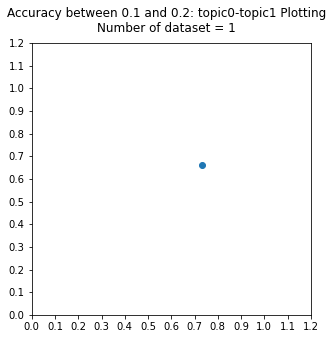

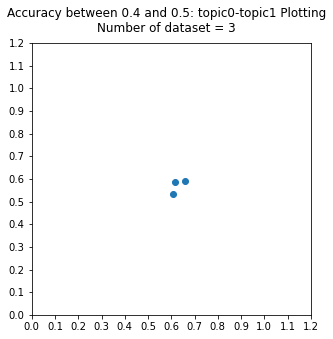

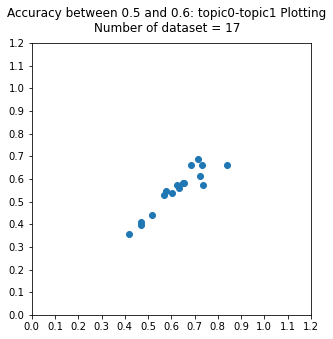

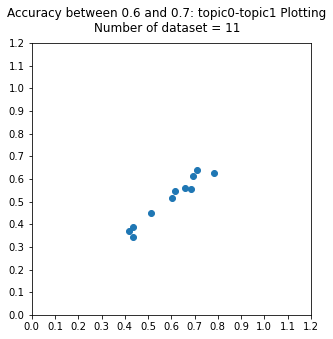

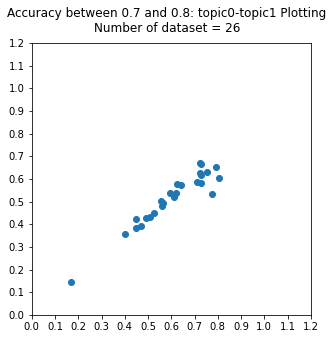

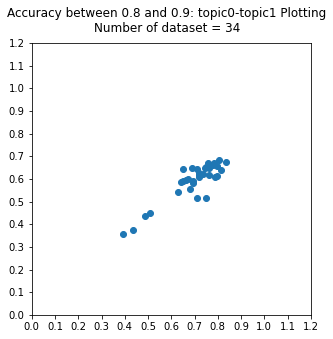

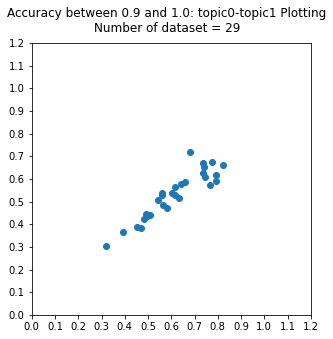

In [16]:
acc_range = list(order_plot.keys())
for key in acc_range:
    datasetIDs = order_plot[key]
    
    w0 = [pu[idx,0] for idx in datasetIDs]
    w1 = [pu[idx,1] for idx in datasetIDs]
    
    plt.figure(figsize=(5, 5))
    plt.scatter(w0, w1)

    plt.xticks(np.arange(0, 1.21, 0.1))
    plt.yticks(np.arange(0, 1.21, 0.1))
    plt.suptitle('Accuracy between '+str(key/10)+' and '+str((key+1)/10)+': topic0-topic1 Plotting'+'\n'+'Number of dataset = ' + str(len(datasetIDs)))

plt.show()

## 2. Cluster pipelines by qi (2 topics -> pipelines)

In [17]:
qi.shape

(256, 2)

In [18]:
qi

array([[0.61748009, 0.49562717],
       [0.62650104, 0.47142414],
       [0.62695497, 0.63325561],
       [0.65367121, 0.56178276],
       [0.67240193, 0.59346936],
       [0.686928  , 0.62685253],
       [0.67678903, 0.56293833],
       [0.6780093 , 0.55447499],
       [0.5768829 , 0.57461315],
       [0.59033048, 0.44211474],
       [0.68210668, 0.5830376 ],
       [0.6877254 , 0.59827378],
       [0.56970127, 0.43727089],
       [0.60874593, 0.54489728],
       [0.60285593, 0.58109195],
       [0.61300182, 0.55093176],
       [0.64143162, 0.59367322],
       [0.57660109, 0.57427324],
       [0.68087327, 0.55097953],
       [0.67629965, 0.61665039],
       [0.53780821, 0.49994465],
       [0.57576715, 0.43862906],
       [0.68791946, 0.61031467],
       [0.68150715, 0.61300948],
       [0.62112176, 0.53596384],
       [0.64924903, 0.60722727],
       [0.68076421, 0.62332981],
       [0.69094677, 0.61385138],
       [0.65502248, 0.63853698],
       [0.69262653, 0.60951044],
       [0.

#### Pipeline clustering

In [19]:
from scipy.spatial import distance_matrix
Ws = np.column_stack([qi[:, 0], qi[:, 1]]) # vals = [accs, w0, w1]
dists = distance_matrix(Ws, Ws)

def llf(id):
    if id < 256:
        return 'PipelineID=' + str(id) + ': ' + str(filter_pplID_name[id])

In [74]:
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster import hierarchy

Z = hierarchy.linkage(dists)
#lm = np.column_stack([agg.children_, agg.distances_])
with plt.rc_context(rc={'figure.figsize' : (100,400)}):
    dendrogram(Z, leaf_font_size=12, leaf_label_func=llf, leaf_rotation=90)

/tmp/wsuser/ipykernel_133/4260424887.py:4: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = hierarchy.linkage(dists)


#### Pipeline clustering

In [21]:
ppl_acc = {} # {pipelineID: mean_acc}
for pplID in range(256):
    mean_acc = mean(list(df.query('pipeline_id == ' + str(pplID))['accuracy']))
    ppl_acc[pplID] = mean_acc
ppl_acc

{0: 0.6118203487205593,
 1: 0.6755467962741322,
 2: 0.6835767734766428,
 3: 0.7889839499071898,
 4: 0.762703744616835,
 5: 0.6458240588745686,
 6: 0.7402171579046787,
 7: 0.7210622165942167,
 8: 0.7124797697425318,
 9: 0.655356687931364,
 10: 0.658574709631504,
 11: 0.6054999608859322,
 12: 0.6422061824315445,
 13: 0.6807618816414106,
 14: 0.7175834474630635,
 15: 0.6308460394589587,
 16: 0.7361966916846802,
 17: 0.7815350035798619,
 18: 0.7558619191610452,
 19: 0.6431034021115698,
 20: 0.7079842676394015,
 21: 0.7964837662199427,
 22: 0.8118623712850986,
 23: 0.8027796661400154,
 24: 0.7977682597389271,
 25: 0.7669978553618846,
 26: 0.7652561611310827,
 27: 0.7582861061021126,
 28: 0.7715692530597328,
 29: 0.7755245021410906,
 30: 0.8092264376777301,
 31: 0.8138144046004339,
 32: 0.8127458468015628,
 33: 0.8205759742742741,
 34: 0.823037188499315,
 35: 0.8231002992120161,
 36: 0.8251516916458733,
 37: 0.8364456698414456,
 38: 0.8296388471798923,
 39: 0.8111814136582248,
 40: 0.8109961

In [26]:
# Acc: 1->[0.1, 0.2), 2->[0.2, 0.3), 3->[0.3, 0.4), 4->[0.4, 0.5), 
# 5->[0.5, 0.6), 6->[0.6, 0.7), 7->[0.7, 0.8), 8->[0.8, 0.9), 9->[0.9, 1.0)
plot_dict = defaultdict(list) # {slot: [datasetID]}
for key, val in ppl_acc.items():
    slot = int(val*10)
    plot_dict[slot].append(key)
order_plot = OrderedDict(sorted(plot_dict.items()))
print(order_plot)

OrderedDict([(6, [0, 1, 2, 5, 9, 10, 11, 12, 13, 15, 19, 70, 72]), (7, [3, 4, 6, 7, 8, 14, 16, 17, 18, 20, 21, 24, 25, 26, 27, 28, 29, 63, 64, 65, 66, 67, 68, 69, 71, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 144, 147, 148, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 170, 172, 177, 178, 182, 192, 236, 237, 240, 242, 244, 255]), (8, [22, 23, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 145, 146, 149, 150, 161, 162, 163, 164, 165, 166, 167, 168, 169, 171, 173, 174, 175, 176, 179, 180, 181, 183, 184, 185, 186, 187, 188, 189, 190, 191, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209

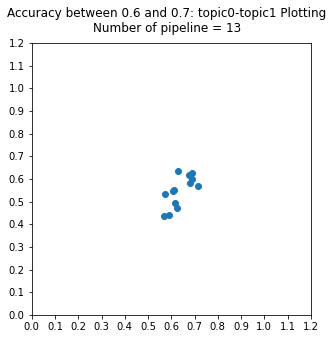

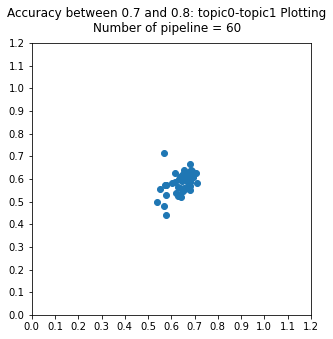

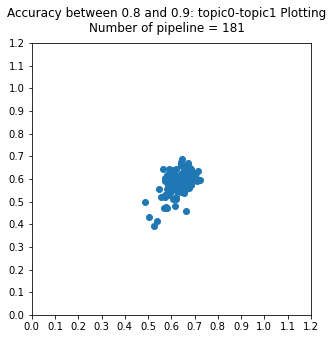

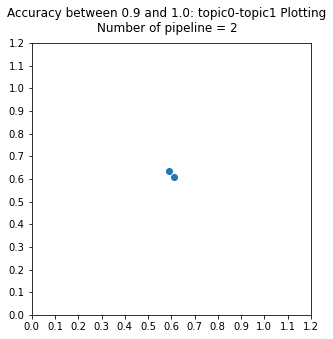

In [24]:
acc_range = list(order_plot.keys())
for key in acc_range:
    pplIDs = order_plot[key]
    
    w0 = [qi[idx,0] for idx in pplIDs]
    w1 = [qi[idx,1] for idx in pplIDs]
    
    plt.figure(figsize=(5, 5))
    plt.scatter(w0, w1)

    plt.xticks(np.arange(0, 1.21, 0.1))
    plt.yticks(np.arange(0, 1.21, 0.1))
    plt.suptitle('Accuracy between '+str(key/10)+' and '+str((key+1)/10)+': topic0-topic1 Plotting'+'\n'+'Number of pipeline = ' + str(len(pplIDs)))

plt.show()

## PipelineID mapping

In [4]:
filename='pplID_mapping_df.csv'
my_file = project.get_file(filename)
my_file.seek(0)
df = pd.read_csv(my_file)
df

,0,1,2,3,4,5,6,7,8,9,...,303,304,305,306,307,308,309,310,311,312
0,"Pipeline(steps=[('bernoullinb', BernoulliNB(bi...","Pipeline(steps=[('multinomialnb', MultinomialN...","Pipeline(steps=[('decisiontreeclassifier',\n ...","Pipeline(steps=[('extratreesclassifier',\n ...","Pipeline(steps=[('randomforestclassifier',\n ...","Pipeline(steps=[('gradientboostingclassifier',...","Pipeline(steps=[('kneighborsclassifier',\n ...","Pipeline(steps=[('linearsvc',\n ...","Pipeline(steps=[('logisticregression',\n ...","Pipeline(steps=[('sgdclassifier',\n ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"Pipeline(steps=[('bernoullinb', BernoulliNB(bi...","Pipeline(steps=[('multinomialnb', MultinomialN...","Pipeline(steps=[('decisiontreeclassifier',\n ...","Pipeline(steps=[('extratreesclassifier',\n ...","Pipeline(steps=[('randomforestclassifier',\n ...","Pipeline(steps=[('gradientboostingclassifier',...","Pipeline(steps=[('kneighborsclassifier',\n ...","Pipeline(steps=[('linearsvc',\n ...","Pipeline(steps=[('logisticregression',\n ...","Pipeline(steps=[('sgdclassifier',\n ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"Pipeline(steps=[('bernoullinb', BernoulliNB(bi...","Pipeline(steps=[('multinomialnb', MultinomialN...","Pipeline(steps=[('decisiontreeclassifier',\n ...","Pipeline(steps=[('extratreesclassifier',\n ...","Pipeline(steps=[('randomforestclassifier',\n ...","Pipeline(steps=[('gradientboostingclassifier',...","Pipeline(steps=[('kneighborsclassifier',\n ...","Pipeline(steps=[('linearsvc',\n ...","Pipeline(steps=[('logisticregression',\n ...","Pipeline(steps=[('sgdclassifier',\n ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"Pipeline(steps=[('bernoullinb', BernoulliNB(bi...","Pipeline(steps=[('multinomialnb', MultinomialN...","Pipeline(steps=[('decisiontreeclassifier',\n ...","Pipeline(steps=[('extratreesclassifier',\n ...","Pipeline(steps=[('randomforestclassifier',\n ...","Pipeline(steps=[('gradientboostingclassifier',...","Pipeline(steps=[('kneighborsclassifier',\n ...","Pipeline(steps=[('linearsvc',\n ...","Pipeline(steps=[('logisticregression',\n ...","Pipeline(steps=[('sgdclassifier',\n ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"Pipeline(steps=[('bernoullinb', BernoulliNB(bi...","Pipeline(steps=[('multinomialnb', MultinomialN...","Pipeline(steps=[('decisiontreeclassifier',\n ...","Pipeline(steps=[('extratreesclassifier',\n ...","Pipeline(steps=[('randomforestclassifier',\n ...","Pipeline(steps=[('gradientboostingclassifier',...","Pipeline(steps=[('kneighborsclassifier',\n ...","Pipeline(steps=[('linearsvc',\n ...","Pipeline(steps=[('logisticregression',\n ...","Pipeline(steps=[('sgdclassifier',\n ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,"Pipeline(steps=[('bernoullinb', BernoulliNB(bi...","Pipeline(steps=[('decisiontreeclassifier',\n ...","Pipeline(steps=[('extratreesclassifier',\n ...","Pipeline(steps=[('randomforestclassifier',\n ...","Pipeline(steps=[('kneighborsclassifier',\n ...","Pipeline(steps=[('linearsvc',\n ...","Pipeline(steps=[('logisticregression',\n ...","Pipeline(steps=[('sgdclassifier',\n ...","Pipeline(steps=[('svc',\n SVC(...","Pipeline(steps=[('perceptron', Perceptron(pena...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
117,"Pipeline(steps=[('bernoullinb', BernoulliNB(bi...","Pipeline(steps=[('multinomialnb', MultinomialN...","Pipeline(steps=[('decisiontreeclassifier',\n ...","Pipeline(steps=[('extratreesclassifier',\n ...","Pipeline(steps=[('randomforestclassifier',\n ...","Pipeline(steps=[('gradientboostingclassifier',...","Pipeline(steps=[('kneighborsclassifier',\n ...","Pipeline(steps=[('linearsvc',\n ...","Pipeline(steps=[('logisticregression',\n ...","Pipeline(steps=[('sgdclassifier',\n ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
118,"Pipeline(steps=[('bernoullinb', BernoulliNB(bi...","Pipeline(steps=[('multinomialnb', MultinomialN...","Pipeline(steps=[('decisiontreeclassifier',\n ..

In [38]:
def get_name(input_str):
    """
    Given a input_str, return a list of all estimator names inside ''
    """
    res = []
    num_est = input_str.count("('")
    for i in range(num_est): 
        begin = input_str.find("('") + 2
        end = input_str.find("',")
        curr = input_str[begin:end]
        res.append(curr)
        input_str = input_str[end+2:]
    return res

['bernoullinb']
['discretizer', 'mlpclassifier']


## Refine pipelineID name

In [44]:
input_str = df.iloc[0, 0]
curr = get_name(input_str)
curr
df.at[0, 0] = curr
df

,0,1,2,3,4,5,6,7,8,9,...,24,25,26,27,28,29,30,31,32,313
0,"Pipeline(steps=[('bernoullinb', BernoulliNB(bi...","Pipeline(steps=[('multinomialnb', MultinomialN...","Pipeline(steps=[('decisiontreeclassifier',\n ...","Pipeline(steps=[('extratreesclassifier',\n ...","Pipeline(steps=[('randomforestclassifier',\n ...","Pipeline(steps=[('gradientboostingclassifier',...","Pipeline(steps=[('kneighborsclassifier',\n ...","Pipeline(steps=[('linearsvc',\n ...","Pipeline(steps=[('logisticregression',\n ...","Pipeline(steps=[('sgdclassifier',\n ...",...,[gradientboostingclassifier],[kneighborsclassifier],[linearsvc],[mlpclassifier],[gaussiannb],[quadraticdiscriminantanalysis],[ridgeclassifier],[baggingclassifier],[nusvc],NaN
1,"Pipeline(steps=[('bernoullinb', BernoulliNB(bi...","Pipeline(steps=[('multinomialnb', MultinomialN...","Pipeline(steps=[('decisiontreeclassifier',\n ...","Pipeline(steps=[('extratreesclassifier',\n ...","Pipeline(steps=[('randomforestclassifier',\n ...","Pipeline(steps=[('gradientboostingclassifier',...","Pipeline(steps=[('kneighborsclassifier',\n ...","Pipeline(steps=[('linearsvc',\n ...","Pipeline(steps=[('logisticregression',\n ...","Pipeline(steps=[('sgdclassifier',\n ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"Pipeline(steps=[('bernoullinb', BernoulliNB(bi...","Pipeline(steps=[('multinomialnb', MultinomialN...","Pipeline(steps=[('decisiontreeclassifier',\n ...","Pipeline(steps=[('extratreesclassifier',\n ...","Pipeline(steps=[('randomforestclassifier',\n ...","Pipeline(steps=[('gradientboostingclassifier',...","Pipeline(steps=[('kneighborsclassifier',\n ...","Pipeline(steps=[('linearsvc',\n ...","Pipeline(steps=[('logisticregression',\n ...","Pipeline(steps=[('sgdclassifier',\n ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"Pipeline(steps=[('bernoullinb', BernoulliNB(bi...","Pipeline(steps=[('multinomialnb', MultinomialN...","Pipeline(steps=[('decisiontreeclassifier',\n ...","Pipeline(steps=[('extratreesclassifier',\n ...","Pipeline(steps=[('randomforestclassifier',\n ...","Pipeline(steps=[('gradientboostingclassifier',...","Pipeline(steps=[('kneighborsclassifier',\n ...","Pipeline(steps=[('linearsvc',\n ...","Pipeline(steps=[('logisticregression',\n ...","Pipeline(steps=[('sgdclassifier',\n ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"Pipeline(steps=[('bernoullinb', BernoulliNB(bi...","Pipeline(steps=[('multinomialnb', MultinomialN...","Pipeline(steps=[('decisiontreeclassifier',\n ...","Pipeline(steps=[('extratreesclassifier',\n ...","Pipeline(steps=[('randomforestclassifier',\n ...","Pipeline(steps=[('gradientboostingclassifier',...","Pipeline(steps=[('kneighborsclassifier',\n ...","Pipeline(steps=[('linearsvc',\n ...","Pipeline(steps=[('logisticregression',\n ...","Pipeline(steps=[('sgdclassifier',\n ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,"Pipeline(steps=[('bernoullinb', BernoulliNB(bi...","Pipeline(steps=[('decisiontreeclassifier',\n ...","Pipeline(steps=[('extratreesclassifier',\n ...","Pipeline(steps=[('randomforestclassifier',\n ...","Pipeline(steps=[('kneighborsclassifier',\n ...","Pipeline(steps=[('linearsvc',\n ...","Pipeline(steps=[('logisticregression',\n ...","Pipeline(steps=[('sgdclassifier',\n ...","Pipeline(steps=[('svc',\n SVC(...","Pipeline(steps=[('perceptron', Perceptron(pena...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
117,"Pipeline(steps=[('bernoullinb', BernoulliNB(bi...","Pipeline(steps=[('multinomialnb', MultinomialN...","Pipeline(steps=[('decisiontreeclassifier',\n ...","Pipeline(steps=[('extratreesclassifier',\n ...","Pipeline(steps=[('randomforestclassifier',\n ...","Pipeline(steps=[('gradientboostingclassifier',...","Pipeline(steps=[('kneighborsclassifier',\n ...","Pipeline(steps=[('linearsvc',\n ...","Pipeline(steps=[('logisticregression',\n ...","Pipeline(steps=[('sgdclassifier',\n ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
118,"Pipeline(steps=[('bernoul

In [57]:
from collections import defaultdict

pplID_name = defaultdict(set)
row, col = df.shape # (row, col) = (#dataset, #pipeline)
for i in range(row):
    for j in range(col):
        input_str = df.iloc[i, j]
        if str(input_str) != 'nan':
            curr = get_name(input_str)
            pplID_name[j].add(str(curr))
pplID_name

defaultdict(set,
            {0: {"['bernoullinb']"},
             1: {"['decisiontreeclassifier']", "['multinomialnb']"},
             2: {"['decisiontreeclassifier']", "['extratreesclassifier']"},
             3: {"['extratreesclassifier']", "['randomforestclassifier']"},
             4: {"['gradientboostingclassifier']",
              "['kneighborsclassifier']",
              "['randomforestclassifier']"},
             5: {"['gradientboostingclassifier']",
              "['kneighborsclassifier']",
              "['linearsvc']"},
             6: {"['kneighborsclassifier']",
              "['linearsvc']",
              "['logisticregression']"},
             7: {"['linearsvc']",
              "['logisticregression']",
              "['sgdclassifier']"},
             8: {"['logisticregression']", "['sgdclassifier']", "['svc']"},
             9: {"['perceptron']", "['sgdclassifier']", "['svc']"},
             10: {"['mlpclassifier']", "['perceptron']", "['svc']"},
             11: {"['m

In [59]:
filter_pplID_name = {key:val for (key, val) in pplID_name.items() if (key >= 0 and key < 313)}
filter_pplID_name

{0: {"['bernoullinb']"},
 1: {"['decisiontreeclassifier']", "['multinomialnb']"},
 2: {"['decisiontreeclassifier']", "['extratreesclassifier']"},
 3: {"['extratreesclassifier']", "['randomforestclassifier']"},
 4: {"['gradientboostingclassifier']",
  "['kneighborsclassifier']",
  "['randomforestclassifier']"},
 5: {"['gradientboostingclassifier']",
  "['kneighborsclassifier']",
  "['linearsvc']"},
 6: {"['kneighborsclassifier']", "['linearsvc']", "['logisticregression']"},
 7: {"['linearsvc']", "['logisticregression']", "['sgdclassifier']"},
 8: {"['logisticregression']", "['sgdclassifier']", "['svc']"},
 9: {"['perceptron']", "['sgdclassifier']", "['svc']"},
 10: {"['mlpclassifier']", "['perceptron']", "['svc']"},
 11: {"['mlpclassifier']",
  "['passiveaggressiveclassifier']",
  "['perceptron']"},
 12: {"['adaboostclassifier']",
  "['mlpclassifier']",
  "['passiveaggressiveclassifier']"},
 13: {"['adaboostclassifier']",
  "['gaussiannb']",
  "['passiveaggressiveclassifier']"},
 14: {"

In [61]:
import pickle
from io import BytesIO
# write into pickle file
buffer = BytesIO()
pickle.dump(filter_pplID_name, buffer, pickle.HIGHEST_PROTOCOL)
print('data pickled into {}, size {}'.format(buffer, buffer.tell()))
buffer.seek(0) # reset for subsequent reading

# save the data with project-lib
assetname='pplID_names_mapping.pickle'
project.save_data(assetname, buffer, overwrite=True)
print('data saved as "{}"'.format(assetname))

data pickled into <_io.BytesIO object at 0x7fba249de6d0>, size 243875
data saved as "pplID_names_mapping.pickle"


In [75]:
# get a dataframe
name_df = pd.DataFrame.from_dict(filter_pplID_name, orient='index')
name_df

,0,1,2,3,4,5,6,7,8,9,...,41,42,43,44,45,46,47,48,49,50
0,['bernoullinb'],None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1,['decisiontreeclassifier'],['multinomialnb'],None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
2,['decisiontreeclassifier'],['extratreesclassifier'],None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
3,['randomforestclassifier'],['extratreesclassifier'],None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
4,['kneighborsclassifier'],['randomforestclassifier'],['gradientboostingclassifier'],None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
308,"['perceptronfeature', 'gradientboostingclassif...",None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
309,"['passiveaggressiveclassifierfeature', 'gradie...",None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
310,"['gaussiannbfeature', 'gradientboostingclassif...",None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
311,"['baggingclassifierfeature', 'gradientboosting...",None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


In [76]:
filename = 'pplID_names_mapping.csv'
project.save_data(data=name_df.to_csv(index=False),file_name=filename,overwrite=True)

{'file_name': 'pplID_names_mapping.csv',
 'message': 'File saved to project storage.',
 'bucket_name': 'internwork-donotdelete-pr-m3fjcscdiuwou3',
 'asset_id': 'ac196239-c1f7-4bae-87d7-5a8efb395d41'}